# Analyze Representations in Path-Integrating Recurrent Neural Networks

## Set Up + Imports

In [46]:
import setup

setup.main()
%load_ext autoreload
%autoreload 2
%load_ext jupyter_black

import neurometry.datasets.synthetic as synthetic
import numpy as np
import skdim

from neurometry.dimension.dimension import skdim_dimension_estimation
from neurometry.dimension.dimension import plot_dimension_experiments

import matplotlib.pyplot as plt


import os

os.environ["GEOMSTATS_BACKEND"] = "pytorch"
import geomstats.backend as gs
import torch

Working directory:  /home/facosta/neurometry/neurometry
Directory added to path:  /home/facosta/neurometry
Directory added to path:  /home/facosta/neurometry/neurometry
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black


## Single-Agent RNN

### Load activations across training epochs

In [47]:
import sys

path = os.getcwd() + "/datasets/rnn_grid_cells"
sys.path.append(path)
from neurometry.datasets.load_rnn_grid_cells import load_activations

In [48]:
epochs = list(range(0, 100, 5))

epochs.append("final")
(
    single_agent_activations,
    single_agent_rate_maps,
    single_agent_state_points,
) = load_activations(epochs, version="single", verbose=True)

Epoch 0 found!!! :D
Epoch 5 found!!! :D
Epoch 10 found!!! :D
Epoch 15 found!!! :D
Epoch 20 found!!! :D
Epoch 25 found!!! :D
Epoch 30 found!!! :D
Epoch 35 found!!! :D
Epoch 40 found!!! :D
Epoch 45 found!!! :D
Epoch 50 found!!! :D
Epoch 55 found!!! :D
Epoch 60 found!!! :D
Epoch 65 found!!! :D
Epoch 70 found!!! :D
Epoch 75 found!!! :D
Epoch 80 found!!! :D
Epoch 85 found!!! :D
Epoch 90 found!!! :D
Epoch 95 found!!! :D
Epoch final found!!! :D
Loaded epochs [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 'final'] of single agent model.
There are 4096 grid cells with 20 x 20 environment resolution, averaged over 50 trajectories.
There are 20000 data points in the 4096-dimensional state space.
There are 400 data points averaged over 50 trajectories in the 4096-dimensional state space.


### Plot final activations

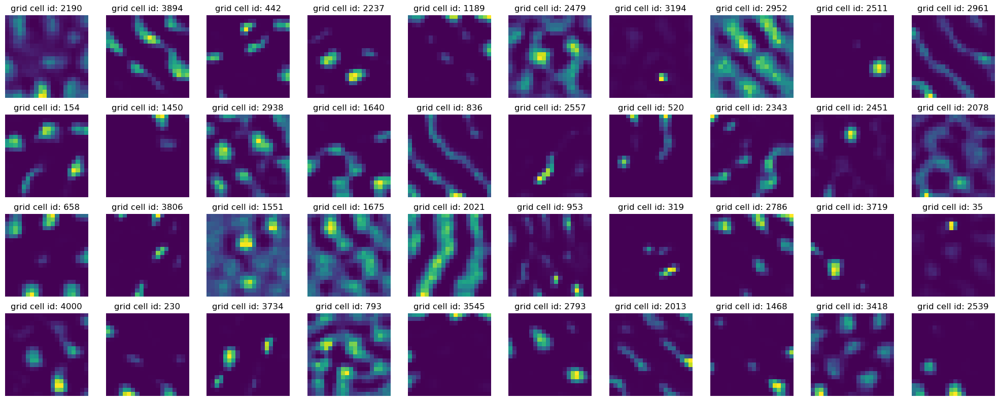

In [49]:
from neurometry.datasets.load_rnn_grid_cells import plot_rate_map

plot_rate_map(None, 40, single_agent_activations[-1])

### Load Training Loss

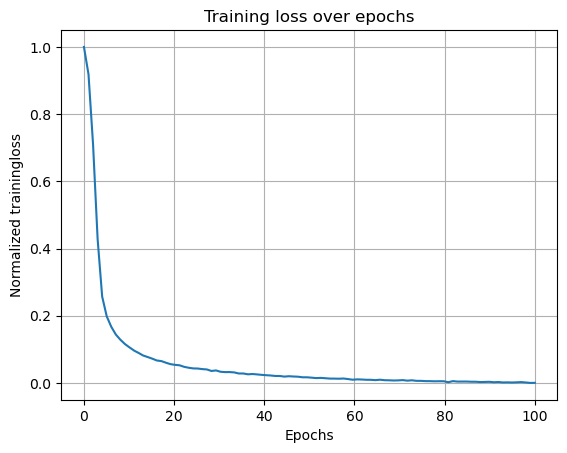

In [50]:
model_folder = "Single agent path integration/Seed 1 weight decay 1e-06/"
model_parameters = "steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06/"

loss_path = (
    "/scratch/facosta/rnn_grid_cells/" + model_folder + model_parameters + "loss.npy"
)

loss = np.load(loss_path)

loss_aggregated = np.mean(loss.reshape(-1, 1000), axis=1)

loss_normalized = (loss_aggregated - np.min(loss_aggregated)) / (
    np.max(loss_aggregated) - np.min(loss_aggregated)
)

plt.plot(np.linspace(0, 100, 100), loss_normalized)
plt.xlabel("Epochs")
plt.ylabel("Normalized trainingloss")
plt.title("Training loss over epochs")
plt.grid()

### Extract representations from epoch = 0  to epoch = 100 (final)

In [51]:
representations = []

for rep in single_agent_rate_maps:
    points = rep.T
    norm_points = points / np.linalg.norm(points, axis=1)[:, None]
    representations.append(norm_points)

In [52]:
print(
    f"There are {representations[0].shape[0]} points in {representations[0].shape[1]}-dimensional space"
)

There are 400 points in 4096-dimensional space


### Compute Persistent Homology using $\texttt{giotto-tda}$

In [19]:
from gtda.homology import WeakAlphaPersistence, VietorisRipsPersistence
from gtda.diagrams import PairwiseDistance
from gtda.plotting import plot_diagram, plot_heatmap
import neurometry.datasets.synthetic as synthetic

Load synthetic 1-sphere, 2-sphere, and 2-torus neural manifolds

In [20]:
num_points = representations[0].shape[0]
embedding_dim = representations[0].shape[1]

task_points_circle = synthetic.hypersphere(intrinsic_dim=1, num_points=num_points)

_, circle_points = synthetic.synthetic_neural_manifold(
    points=task_points_circle,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_circle_points = circle_points / np.linalg.norm(circle_points, axis=1)[:, None]

task_points_sphere = synthetic.hypersphere(intrinsic_dim=2, num_points=num_points)

_, sphere_points = synthetic.synthetic_neural_manifold(
    points=task_points_sphere,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_sphere_points = sphere_points / np.linalg.norm(sphere_points, axis=1)[:, None]

task_points_sphere3 = synthetic.hypersphere(intrinsic_dim=3, num_points=num_points)

_, sphere3_points = synthetic.synthetic_neural_manifold(
    points=task_points_sphere3,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_sphere3_points = sphere3_points / np.linalg.norm(sphere3_points, axis=1)[:, None]


torus_task_points = synthetic.hypertorus(intrinsic_dim=2, num_points=num_points)

_, torus_points = synthetic.synthetic_neural_manifold(
    points=torus_task_points,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_torus_points = torus_points / np.linalg.norm(torus_points, axis=1)[:, None]


torus3_task_points = synthetic.hypertorus(intrinsic_dim=3, num_points=num_points)

_, torus3_points = synthetic.synthetic_neural_manifold(
    points=torus3_task_points,
    encoding_dim=embedding_dim,
    nonlinearity="linear",
)

norm_torus3_points = torus3_points / np.linalg.norm(torus3_points, axis=1)[:, None]

WARNING! Poisson spikes not generated: mean must be non-negative
WARNING! Poisson spikes not generated: mean must be non-negative
WARNING! Poisson spikes not generated: mean must be non-negative
WARNING! Poisson spikes not generated: mean must be non-negative
WARNING! Poisson spikes not generated: mean must be non-negative


In [12]:
num_points = 100

embedding_dim = 10

task_points_circle = synthetic.hypersphere(intrinsic_dim=1, num_points=num_points)

noisy_circle_points, circle_points = synthetic.synthetic_neural_manifold(
    points=task_points_circle,
    encoding_dim=embedding_dim,
    nonlinearity="tanh",
    poisson_multiplier=1,
    scales=torch.ones(embedding_dim),
)

print(
    f"There are {circle_points.shape[0]} points in {circle_points.shape[1]}-dimensional space"
)

noise level: 7.07%
There are 100 points in 10-dimensional space


In [13]:
num_points = 100

embedding_dim = 10

task_points_sphere2 = synthetic.hypersphere(intrinsic_dim=2, num_points=num_points)

noisy_sphere2_points, sphere2_points = synthetic.synthetic_neural_manifold(
    points=task_points_sphere2,
    encoding_dim=embedding_dim,
    nonlinearity="tanh",
    poisson_multiplier=1,
    scales=torch.ones(embedding_dim),
)

print(
    f"There are {sphere2_points.shape[0]} points in {sphere2_points.shape[1]}-dimensional space"
)

noise level: 7.07%
There are 100 points in 10-dimensional space


In [ ]:
num_points = 100

embedding_dim = 10

task_points_torus2 = synthetic.hypertorus(intrinsic_dim=2, num_points=num_points)

noisy_torus2_points, torus2_points = synthetic.synthetic_neural_manifold(
    points=task_points_torus2,
    encoding_dim=embedding_dim,
    nonlinearity="tanh",
    poisson_multiplier=1,
    scales=torch.ones(embedding_dim),
)

print(
    f"There are {torus2_points.shape[0]} points in {sphere2_points.shape[1]}-dimensional space"
)

Load or Compute Vietoris-Rips persistence diagrams

In [21]:
homology_dimensions = (
    0,
    1,
    2,
    3,
)
VR = VietorisRipsPersistence(homology_dimensions=homology_dimensions)

In [22]:
try:
    print("Loading Vietoris-Rips persistence diagrams")
    vr_diagrams = np.load("datasets/rnn_grid_cells/single_agent_vr_pers_diagrams.npy")

except:
    print("Computing Vietoris-Rips persistence diagrams")
    vr_diagrams = VR.fit_transform(
        representations
        + [norm_circle_points]
        + [norm_sphere_points]
        + [norm_torus_points]
        + [norm_sphere3_points]
        + [norm_torus3_points]
    )
    np.save("datasets/rnn_grid_cells/single_agent_vr_pers_diagrams.npy", vr_diagrams)


print(
    f"There are {vr_diagrams.shape[0]} persistence diagrams. Each diagram has {vr_diagrams.shape[1]} features (points)."
)

Loading Vietoris-Rips persistence diagrams
There are 25 persistence diagrams. Each diagram has 1635 features (points).


Each feature is a triple $[b, d, q]$, where $q$ is the dimension, $b$ is the birth time, $d$ is the death time

In [23]:
fig_torus3 = plot_diagram(
    vr_diagrams[-1],
    plotly_params={"title": "Vietoris-Rips Persistence Diagram, 3-torus"},
)
fig_torus3.update_layout(title="Vietoris-Rips Persistence Diagram, 3-torus")

Note: the Poincaré polynomial of a surface is the generating function of its Betti numbers. 

the Poincaré polynomial of an $n$-torus is $(1+x)^n$, by the Künneth theorem. The Betti numbers are therefore the binomial coefficients.

Thus for the $3$-torus, the non-zero Betti numbers are $(1,3,3,1)$.

In [13]:
fig_sphere3 = plot_diagram(
    vr_diagrams[-2],
    plotly_params={"title": "Vietoris-Rips Persistence Diagram, 3-sphere"},
)
fig_sphere3.update_layout(title="Vietoris-Rips Persistence Diagram, 3-sphere")

In [14]:
fig_rep_final = plot_diagram(
    vr_diagrams[-6],
    plotly_params={"title": "Vietoris-Rips Persistence Diagram, final representation"},
)
fig_rep_final.update_layout(
    title="Vietoris-Rips Persistence Diagram, final representation"
)

### Compute pairwise topological distance ("landscape")

In [15]:
landscape_PD = PairwiseDistance(metric="landscape", n_jobs=-1)

landscape_distance = landscape_PD.fit_transform(vr_diagrams)

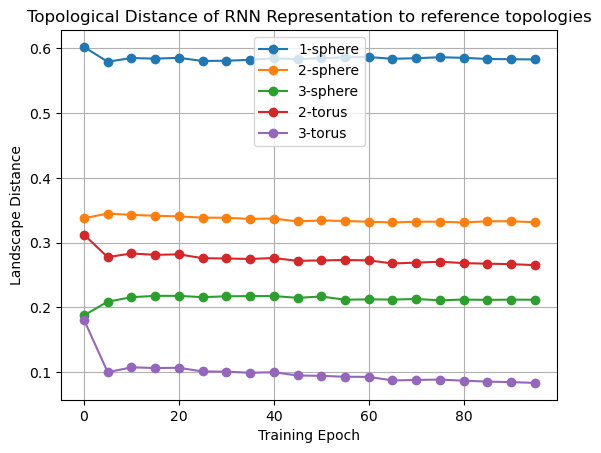

In [20]:
landscape_distance_to_circle = landscape_distance[-5, :-5]
landscape_distance_to_sphere = landscape_distance[-4, :-5]
landscape_distance_to_torus = landscape_distance[-3, :-5]
landscape_distance_to_sphere3 = landscape_distance[-2, :-5]
landscape_distance_to_torus3 = landscape_distance[-1, :-5]
plt.plot(epochs[:-1], landscape_distance_to_circle, "o-", label="1-sphere")
plt.plot(epochs[:-1], landscape_distance_to_sphere, "o-", label="2-sphere")
plt.plot(epochs[:-1], landscape_distance_to_sphere3, "o-", label="3-sphere")
plt.plot(epochs[:-1], landscape_distance_to_torus, "o-", label="2-torus")
plt.plot(epochs[:-1], landscape_distance_to_torus3, "o-", label="3-torus")
plt.xlabel("Training Epoch")
plt.ylabel("Landscape Distance")
plt.title("Topological Distance of RNN Representation to reference topologies")
plt.grid()
plt.legend();

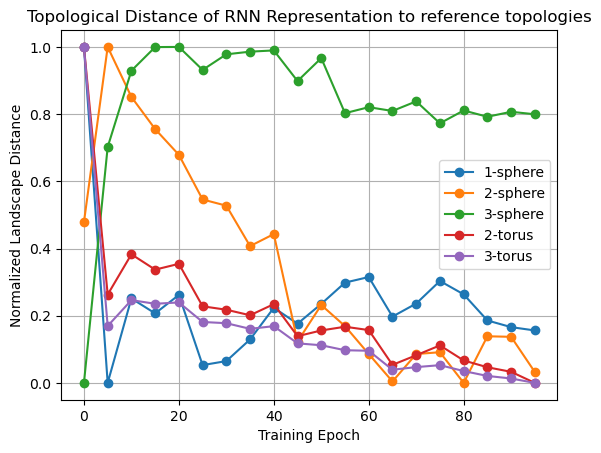

In [19]:
norm_landscape_distance_to_circle = (
    landscape_distance_to_circle - np.min(landscape_distance_to_circle)
) / (np.max(landscape_distance_to_circle) - np.min(landscape_distance_to_circle))

norm_landscape_distance_to_sphere = (
    landscape_distance_to_sphere - np.min(landscape_distance_to_sphere)
) / (np.max(landscape_distance_to_sphere) - np.min(landscape_distance_to_sphere))

norm_landscape_distance_to_sphere3 = (
    landscape_distance_to_sphere3 - np.min(landscape_distance_to_sphere3)
) / (np.max(landscape_distance_to_sphere3) - np.min(landscape_distance_to_sphere3))

norm_landscape_distance_to_torus = (
    landscape_distance_to_torus - np.min(landscape_distance_to_torus)
) / (np.max(landscape_distance_to_torus) - np.min(landscape_distance_to_torus))

norm_landscape_distance_to_torus3 = (
    landscape_distance_to_torus3 - np.min(landscape_distance_to_torus3)
) / (np.max(landscape_distance_to_torus3) - np.min(landscape_distance_to_torus3))

plt.plot(epochs, norm_landscape_distance_to_circle, "o-", label="1-sphere")
plt.plot(epochs, norm_landscape_distance_to_sphere, "o-", label="2-sphere")
plt.plot(epochs, norm_landscape_distance_to_sphere3, "o-", label="3-sphere")
plt.plot(epochs, norm_landscape_distance_to_torus, "o-", label="2-torus")
plt.plot(epochs, norm_landscape_distance_to_torus3, "o-", label="3-torus")
plt.xlabel("Training Epoch")
plt.ylabel("Normalized Landscape Distance")
plt.title("Topological Distance of RNN Representation to reference topologies")
plt.grid()
plt.legend();

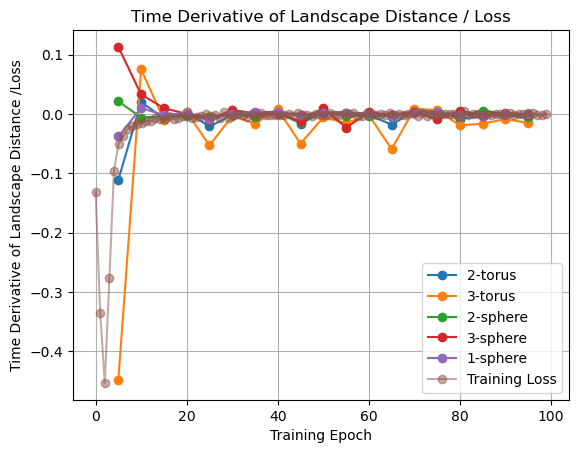

In [95]:
landscape_distance_to_torus_diff = (
    np.diff(landscape_distance_to_torus) / landscape_distance_to_torus[:-1]
)
landscape_distance_to_torus3_diff = (
    np.diff(landscape_distance_to_torus3) / landscape_distance_to_torus3[:-1]
)
landscape_distance_to_sphere_diff = (
    np.diff(landscape_distance_to_sphere) / landscape_distance_to_sphere[:-1]
)
landscape_distance_to_sphere3_diff = (
    np.diff(landscape_distance_to_sphere3) / landscape_distance_to_sphere3[:-1]
)
landscape_distance_to_circle_diff = (
    np.diff(landscape_distance_to_circle) / landscape_distance_to_circle[:-1]
)

loss_diff = np.diff(loss_normalized) / loss_aggregated[:-1]

plt.plot(epochs[1:], landscape_distance_to_torus_diff, "o-", label="2-torus")
plt.plot(epochs[1:], landscape_distance_to_torus3_diff, "o-", label="3-torus")
plt.plot(epochs[1:], landscape_distance_to_sphere_diff, "o-", label="2-sphere")
plt.plot(epochs[1:], landscape_distance_to_sphere3_diff, "o-", label="3-sphere")
plt.plot(epochs[1:], landscape_distance_to_circle_diff, "o-", label="1-sphere")
plt.plot(np.linspace(0, 99, 99), 10 * loss_diff, "o-", label="Training Loss", alpha=0.5)
plt.xlabel("Training Epoch")
plt.ylabel("Time Derivative of Landscape Distance /Loss")
plt.legend()
plt.title("Time Derivative of Landscape Distance / Loss")
plt.grid();

In [15]:
error_normalized = (error - np.min(error)) / (np.max(error) - np.min(error))
loss_normalized = (loss_aggregated - np.min(loss_aggregated)) / (
    np.max(loss_aggregated) - np.min(loss_aggregated)
)

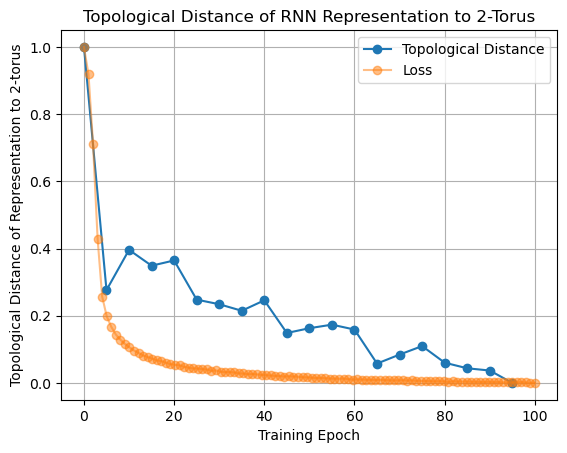

In [16]:
plt.plot(epochs, error_normalized, "o-", label="Topological Distance")
plt.plot(np.linspace(0, 100, 100), loss_normalized, "o-", alpha=0.5, label="Loss")
plt.xlabel("Training Epoch")
plt.ylabel("Topological Distance of Representation to 2-torus")
plt.title("Topological Distance of RNN Representation to 2-Torus")
plt.grid()
plt.legend();

In [23]:
fig_epoch_0 = plot_diagram(
    vr_diagrams[1],
    homology_dimensions=(0, 1, 2),
    plotly_params={"title": "Vietoris-Rips PD, single-agent RNN, epoch=0"},
)
fig_epoch_0.update_layout(title="Vietoris-Rips PD, single-agent RNN, epoch=0")

In [24]:
fig_epoch_95 = plot_diagram(
    vr_diagrams[-1],
    homology_dimensions=(0, 1, 2),
    plotly_params={"title": "Vietoris-Rips PD, single-agent RNN, epoch=95"},
)
fig_epoch_95.update_layout(title="Vietoris-Rips PD, single-agent RNN, epoch=95")

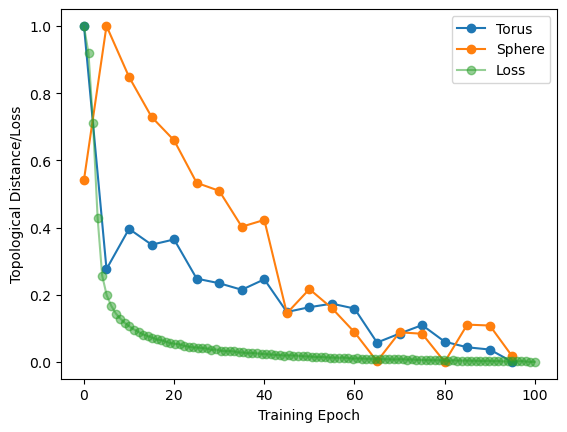

In [30]:
sphere_error_normalized = (sphere_error - np.min(sphere_error)) / (
    np.max(sphere_error) - np.min(sphere_error)
)

plt.plot(epochs, error_normalized, "o-", label="Torus")
plt.plot(epochs, sphere_error_normalized, "o-", label="Sphere")
plt.plot(np.linspace(0, 100, 100), loss_normalized, "o-", alpha=0.5, label="Loss")
plt.xlabel("Training Epoch")
plt.ylabel("Topological Distance/Loss")
plt.legend();

### Estimate rank of connectivity matrix

Get final model (epoch $=100$)

### Compare run-times of $\texttt{giotto-tda}, \texttt{ripser}, \texttt{giotto-ph}$

In [20]:
from gtda.homology import WeakAlphaPersistence, VietorisRipsPersistence
from ripser import ripser
from persim import plot_diagrams
from gph import ripser_parallel

import time


final_representation = representations[-1]


homology_dimensions = (
    0,
    1,
    2,
)
VR = VietorisRipsPersistence(homology_dimensions=homology_dimensions)


gtda_start = time.time()
gtda_vr_diagrams = VR.fit_transform([final_representation])
gtda_end = time.time()
print(
    f"Time to compute Vietoris-Rips persistence diagrams in giotto-tda: {gtda_end - gtda_start:.2f}"
)


ripser_start = time.time()
diagrams = ripser(representations[-1], maxdim=2)["dgms"]
ripser_end = time.time()
print(
    f"Time to compute Vietoris-Rips persistence diagrams in ripser: {ripser_end - ripser_start:.2f}"
)


gph_start = time.time()
gph_vr_diagrams = ripser_parallel(final_representation, maxdim=2, n_threads=-1)
gph_end = time.time()
print(
    f"Time to compute Vietoris-Rips persistence diagrams in giotto-ph: {gph_end - gph_start:.2f} sec"
)

Time to compute Vietoris-Rips persistence diagrams in giotto-tda: 4.770987272262573
Time to compute Vietoris-Rips persistence diagrams in ripser: 15.016701698303223
Time to compute Vietoris-Rips persistence diagrams in giotto-ph: 3.094177722930908


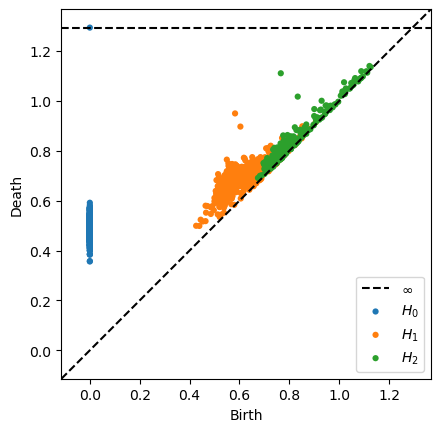

In [37]:
plot_diagrams(gph_vr_diagrams["dgms"])

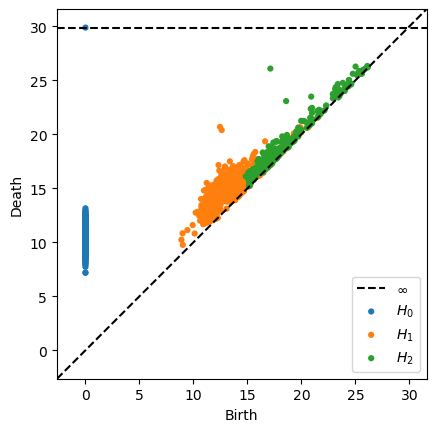

In [70]:
diags = ripser_parallel(
    representations[-1], maxdim=2, coeff=2, metric="manhattan", n_threads=-1
)["dgms"]

plot_diagrams(diags)

In [71]:
gph_diagrams = {}

for i in range(len(epochs)):
    gph_diagrams[epochs[i]] = ripser_parallel(
        representations[i], maxdim=2, coeff=2, metric = 'euclidean',n_threads=-1
    )["dgms"]

plot_diagrams(gph_diagrams["final"])

### Isolate Grid Cells (cells with high grid score)

In [53]:
grid_scores_all_epochs = []
band_scores_all_epochs = []
border_scores_all_epochs = []
for epoch in epochs:
    scores_dir = (
        "/scratch/facosta/rnn_grid_cells/" + model_folder + model_parameters + "scores/"
    )
    grid_scores_all_epochs.append(
        np.load(scores_dir + f"score_60_single_agent_epoch_{epoch}.npy")
    )
    band_scores_all_epochs.append(
        np.load(scores_dir + f"band_scores_single_agent_epoch_{epoch}.npy")
    )
    border_scores_all_epochs.append(
        np.load(scores_dir + f"border_scores_single_agent_epoch_{epoch}.npy")
    )

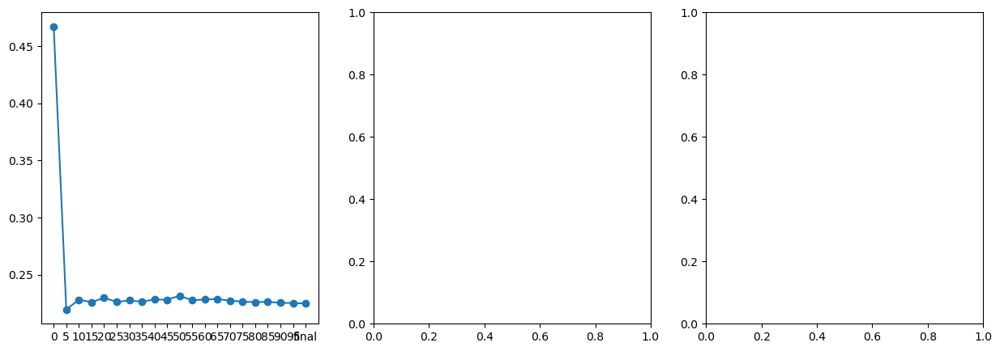

In [40]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

mean_grid_scores = [np.mean(scores) for scores in grid_scores_all_epochs]

ax[0].plot(epochs, mean_grid_scores, "o-");

In [50]:
# get a sort of grid scores at last epoch
final_epoch_grid_score_sort = np.argsort(grid_scores_all_epochs[-1])

# apply sort to all grid scores
sorted_grid_scores_all_epochs = []

for grid_scores in grid_scores_all_epochs:
    sorted_grid_scores_all_epochs.append(grid_scores[final_epoch_grid_score_sort])
# sorted_grid_scores = [np.mean(score[sort]) for score in grid_scores_all_epochs]

see 40 units with highest grid scores:

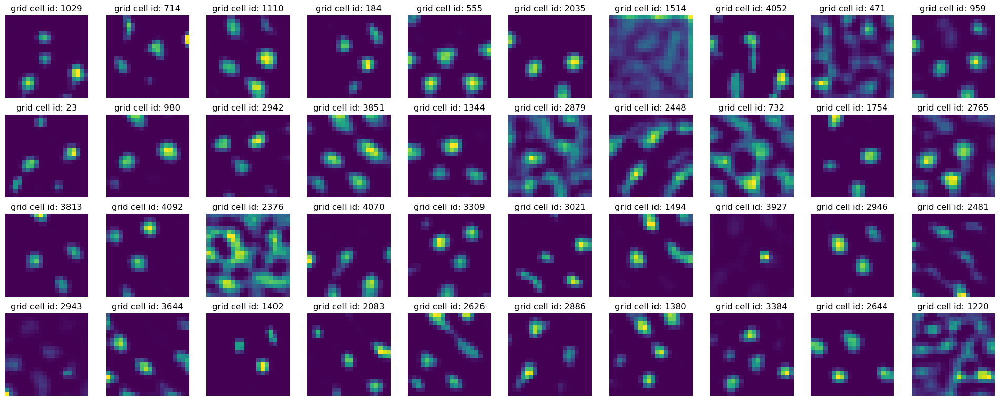

In [68]:
plot_rate_map(final_epoch_grid_score_sort[-40:], None, single_agent_activations[-1])

See 40 units with lowest grid score:

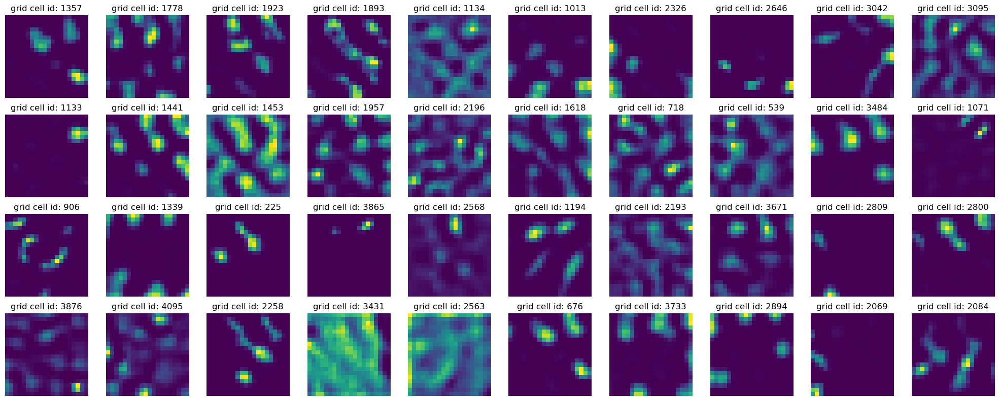

In [69]:
plot_rate_map(final_epoch_grid_score_sort[:40], None, single_agent_activations[-1])

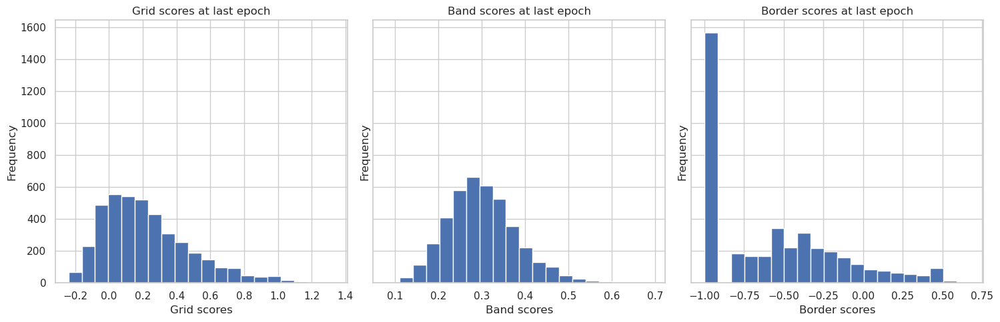

In [117]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

ax[0].hist(grid_scores_all_epochs[-1], bins=20)
ax[0].set_xlabel("Grid scores")
ax[0].set_ylabel("Frequency")
ax[0].set_title("Grid scores at last epoch")

ax[1].hist(band_scores_all_epochs[-1], bins=20)
ax[1].set_xlabel("Band scores")
ax[1].set_ylabel("Frequency")
ax[1].set_title("Band scores at last epoch")

ax[2].hist(border_scores_all_epochs[-1], bins=20)
ax[2].set_xlabel("Border scores")
ax[2].set_ylabel("Frequency")
ax[2].set_title("Border scores at last epoch")

plt.tight_layout()

In [111]:
num_top_bottom = 40

lowest_grid_scores_over_time = [
    np.mean(sorted_grid_scores_all_epochs[i][:num_top_bottom])
    for i in range(len(epochs))
]

top_grid_scores_over_time = [
    np.mean(sorted_grid_scores_all_epochs[i][-num_top_bottom:])
    for i in range(len(epochs))
]

average_grid_scores_over_time = [
    np.mean(sorted_grid_scores_all_epochs[i]) for i in range(len(epochs))
]

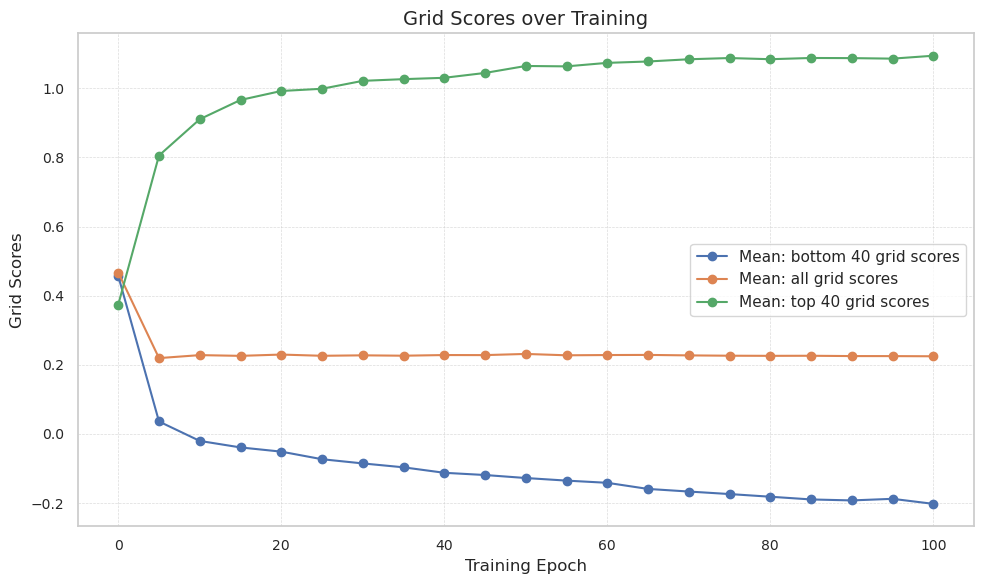

In [113]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(
    epochs[:-1] + [100],
    lowest_grid_scores_over_time,
    "o-",
    label=f"Mean: bottom {num_top_bottom} grid scores",
)
ax.plot(
    epochs[:-1] + [100],
    average_grid_scores_over_time,
    "o-",
    label="Mean: all grid scores",
)
ax.plot(
    epochs[:-1] + [100],
    top_grid_scores_over_time,
    "o-",
    label=f"Mean: top {num_top_bottom} grid scores",
)

ax.set_xlabel("Training Epoch", fontsize=12)
ax.set_ylabel("Grid Scores", fontsize=12)
ax.set_title("Grid Scores over Training", fontsize=14)
ax.tick_params(axis="both", which="major", labelsize=10)


ax.grid(True, which="both", linestyle="--", linewidth=0.5, alpha=0.7)
ax.legend()

plt.tight_layout()

plt.show()

# plt.savefig('grid_scores_over_training.png', dpi=300)

### Isolate Band Cells (cells with high band score)

### Isolate Border cells (cells with high border score)

### Compute Spatial Autocorrelation + UMAP

In [10]:
from neurometry.datasets.rnn_grid_cells.scores import GridScorer

In [11]:
from tqdm import tqdm


def compute_spatial_autocorrelation(res, rate_map_single_agent, scorer):
    print("Computing spatial auto-correlation...")
    _, _, _, _, spatial_autocorrelation, _ = zip(
        *[scorer.get_scores(rm.reshape(res, res)) for rm in tqdm(rate_map_single_agent)]
    )

    spatial_autocorrelation = np.array(spatial_autocorrelation)

    return spatial_autocorrelation

In [19]:
starts = [0.2] * 10
ends = np.linspace(0.4, 1.0, num=10)

box_width = 2.2
box_height = 2.2

res = 20

coord_range = ((-box_width / 2, box_width / 2), (-box_height / 2, box_height / 2))

masks_parameters = zip(starts, ends.tolist())
scorer = GridScorer(res, coord_range, masks_parameters)


# spatial_autocorrelations = []

# for _, epoch in enumerate(epochs):

spatial_autocorrelation = compute_spatial_autocorrelation(
    res, single_agent_rate_maps[-1], scorer
)

print(spatial_autocorrelation.shape)

Computing spatial auto-correlation...


100%|██████████| 4096/4096 [00:35<00:00, 114.23it/s]


In [32]:
def z_standardize(matrix):
    return (matrix - np.mean(matrix, axis=0)) / np.std(matrix, axis=0)


def vectorized_spatial_autocorrelation_matrix(spatial_autocorrelation):
    num_cells = spatial_autocorrelation.shape[0]
    num_bins = spatial_autocorrelation.shape[1] * spatial_autocorrelation.shape[2]

    spatial_autocorrelation_matrix = np.zeros((num_bins, num_cells))

    for i in range(num_cells):
        vector = spatial_autocorrelation[i].flatten()

        spatial_autocorrelation_matrix[:, i] = vector

    return z_standardize(spatial_autocorrelation_matrix)

In [33]:
spatial_autocorrelation_matrix = vectorized_spatial_autocorrelation_matrix(
    spatial_autocorrelation
)

print(spatial_autocorrelation_matrix.shape)

In [43]:
import umap

reducer_2d = umap.UMAP(n_components=2,random_state=42)

embedding = reducer_2d.fit_transform(spatial_autocorrelation_matrix.T)

print(embedding.shape)

(4096, 2)

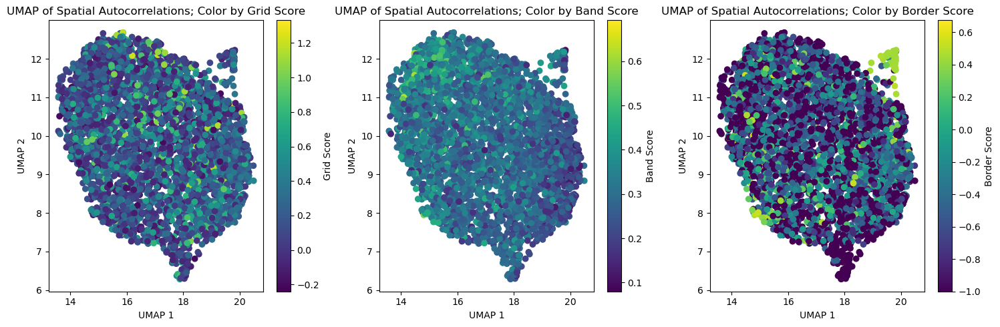

In [70]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot for Grid Scores
sc1 = axs[0].scatter(
    embedding[:, 0], embedding[:, 1], c=grid_scores_all_epochs[-1], cmap="viridis"
)
axs[0].set_xlabel("UMAP 1")
axs[0].set_ylabel("UMAP 2")
axs[0].set_title("UMAP of Spatial Autocorrelations; Color by Grid Score")
fig.colorbar(sc1, ax=axs[0], orientation="vertical", label="Grid Score")

# Plot for Band Scores
sc2 = axs[1].scatter(
    embedding[:, 0], embedding[:, 1], c=band_scores_all_epochs[-1], cmap="viridis"
)
axs[1].set_xlabel("UMAP 1")
axs[1].set_ylabel("UMAP 2")
axs[1].set_title("UMAP of Spatial Autocorrelations; Color by Band Score")
fig.colorbar(sc2, ax=axs[1], orientation="vertical", label="Band Score")

# Plot for Border Scores
sc3 = axs[2].scatter(
    embedding[:, 0], embedding[:, 1], c=border_scores_all_epochs[-1], cmap="viridis"
)
axs[2].set_xlabel("UMAP 1")
axs[2].set_ylabel("UMAP 2")
axs[2].set_title("UMAP of Spatial Autocorrelations; Color by Border Score")
fig.colorbar(sc3, ax=axs[2], orientation="vertical", label="Border Score")

plt.tight_layout()

In [71]:
reducer_3d = umap.UMAP(n_components=3, random_state=42)

embedding_3d = reducer_3d.fit_transform(spatial_autocorrelation_matrix.T)

print(embedding.shape)

(4096, 2)


In [72]:
import plotly.graph_objects as go

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=embedding_3d[:, 0],
            y=embedding_3d[:, 1],
            z=embedding_3d[:, 2],
            mode="markers",
            marker=dict(
                size=5,
                color=grid_scores_all_epochs[-1],  
                colorscale="Viridis", 
                opacity=0.8,
                colorbar=dict(title="Grid Score"),
            ),
        )
    ]
)

fig.update_layout(
    title="3D UMAP Visualization of Spatial Autocorrelations; Color by Grid Score",
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"),
    margin=dict(l=0, r=0, b=0, t=30),
)

fig.show()

In [73]:
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=embedding_3d[:, 0],
            y=embedding_3d[:, 1],
            z=embedding_3d[:, 2],
            mode="markers",
            marker=dict(
                size=5,
                color=band_scores_all_epochs[-1],
                colorscale="Viridis",
                opacity=0.8,
                colorbar=dict(title="Band Score"),
            ),
        )
    ]
)

fig.update_layout(
    title="3D UMAP Visualization of Spatial Autocorrelations; Color by Band Score",
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"),
    margin=dict(l=0, r=0, b=0, t=30),
)

fig.show()

In [74]:
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=embedding_3d[:, 0],
            y=embedding_3d[:, 1],
            z=embedding_3d[:, 2],
            mode="markers",
            marker=dict(
                size=5,
                color=border_scores_all_epochs[-1],
                colorscale="Viridis",
                opacity=0.8,
                colorbar=dict(title="Border Score"),
            ),
        )
    ]
)

fig.update_layout(
    title="3D UMAP Visualization of Spatial Autocorrelations; Color by Border Score",
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"),
    margin=dict(l=0, r=0, b=0, t=30),
)

fig.show()

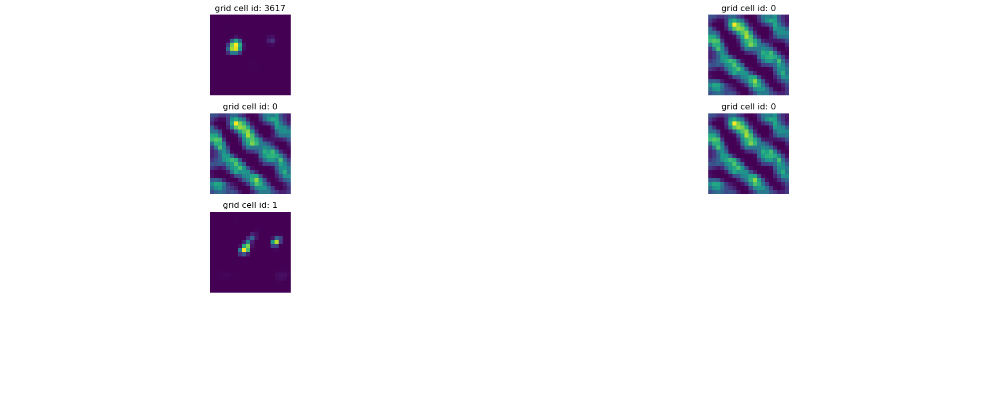

In [29]:
from neurometry.datasets.load_rnn_grid_cells import plot_rate_map

plot_rate_map([3617, 0, 0, 0, 1], 40, single_agent_activations[-1])

### Discover "modules" through clustering / dim reduction? (see Gardner Extended Data Fig. 2)

In [26]:
# parent_dir = os.getcwd() + "/datasets/rnn_grid_cells/"

parent_dir = "/scratch/facosta/rnn_grid_cells/"

single_model_folder = "Single agent path integration/Seed 1 weight decay 1e-06/"
single_model_parameters = "steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06/"

saved_model_single_agent = torch.load(
    parent_dir + single_model_folder + single_model_parameters + "final_model.pth"
)


print(f"The model is a dictionary with keys {saved_model_single_agent.keys()}")

The model is a dictionary with keys odict_keys(['encoder.weight', 'RNN.weight_ih_l0', 'RNN.weight_hh_l0', 'decoder.weight'])


Extract the recurrent connectivity matrix:

In [27]:
W = saved_model_single_agent["RNN.weight_hh_l0"].detach().numpy()
print(f"W has dimensions {W.shape}")

W has dimensions (4096, 4096)


Find singular values of $W$:

In [33]:
singular_values = np.linalg.svd(W, compute_uv=False)

Plot singular value spectrum:

Number of components to explain 90.0% of variance: 372


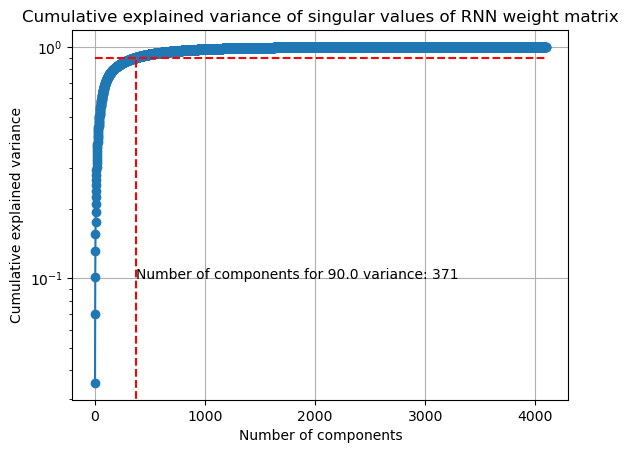

In [57]:
ev_threshold = 0.9

explained_variance = singular_values**2 / np.sum(singular_values**2)

cumulative_explained_variance = np.cumsum(explained_variance)

plt.plot(cumulative_explained_variance, "o-")

plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")

plt.yscale("log")
plt.grid()


plt.title("Cumulative explained variance of singular values of RNN weight matrix")

plt.hlines(
    ev_threshold, 0, len(cumulative_explained_variance), linestyles="dashed", colors="r"
)

plt.vlines(
    np.where(cumulative_explained_variance >= ev_threshold)[0][0],
    0,
    ev_threshold,
    linestyles="dashed",
    colors="r",
)

# show number of components to explain 90% of variance on x-axis
plt.text(
    np.where(cumulative_explained_variance >= ev_threshold)[0][0],
    0.1,
    f"Number of components for {100*ev_threshold} variance: {np.where(cumulative_explained_variance >= ev_threshold)[0][0]}",
)


num_components = np.where(cumulative_explained_variance >= ev_threshold)[0][0] + 1

print(
    f"Number of components to explain {100*ev_threshold}% of variance: {num_components}"
)

## Dual-Agent RNN

### Load activations across training epochs

In [97]:
epochs = list(range(0, 100, 5))
(
    dual_agent_activations,
    dual_agent_rate_maps,
    dual_agent_state_points,
) = load_activations(epochs, version="dual", verbose=True)

Epoch 0 found!!! :D
Epoch 5 found!!! :D
Epoch 10 found!!! :D
Epoch 15 found!!! :D
Epoch 20 found!!! :D
Epoch 25 found!!! :D
Epoch 30 found!!! :D
Epoch 35 found!!! :D
Epoch 40 found!!! :D
Epoch 45 found!!! :D
Epoch 50 found!!! :D
Epoch 55 found!!! :D
Epoch 60 found!!! :D
Epoch 65 found!!! :D
Epoch 70 found!!! :D
Epoch 75 found!!! :D
Epoch 80 found!!! :D
Epoch 85 found!!! :D
Epoch 90 found!!! :D
Epoch 95 found!!! :D
Loaded epochs [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95] of dual agent model.
There are 4096 grid cells with 20 x 20 environment resolution, averaged over 50 trajectories.
There are 20000 data points in the 4096-dimensional state space.
There are 400 data points averaged over 50 trajectories in the 4096-dimensional state space.


### Plot final activations

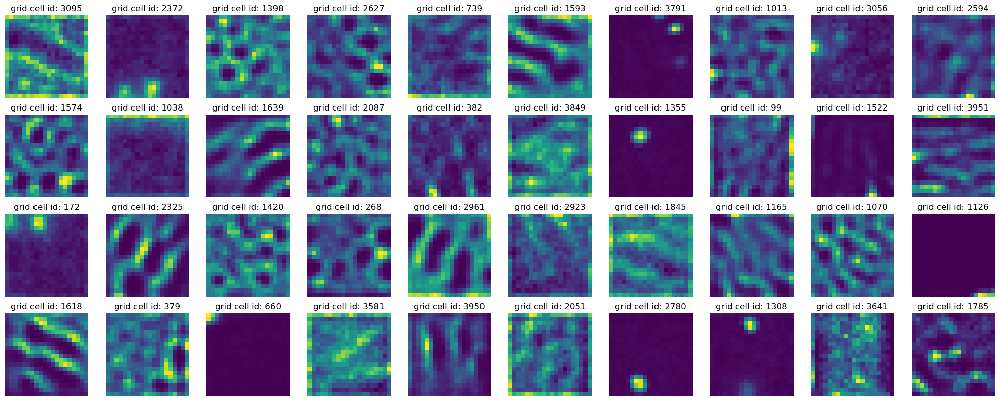

In [98]:
plot_rate_map(40, dual_agent_activations[-1])

### Extract dual agent representations from epoch = 0 to epoch = 95

In [99]:
dual_representations = []

for rep in dual_agent_rate_maps:
    points = rep.T
    norm_points = points / np.linalg.norm(points, axis=1)[:, None]
    dual_representations.append(norm_points)

### Load training loss

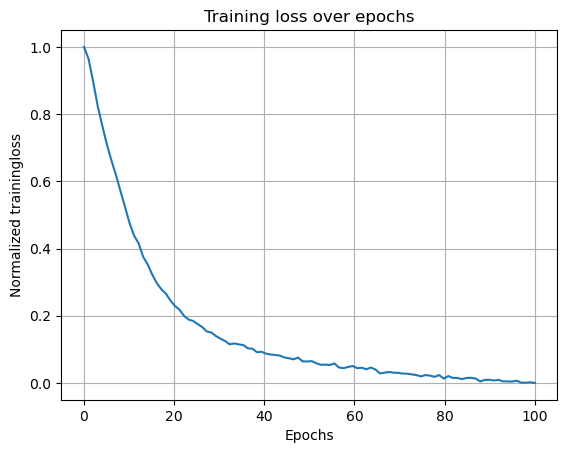

In [103]:
model_folder = "Dual agent path integration disjoint PCs/Seed 1 weight decay 1e-06/"
model_parameters = "steps_20_batch_200_RNN_4096_relu_rf_012_DoG_True_periodic_False_lr_00001_weight_decay_1e-06/"

loss_path = (
    os.getcwd()
    + "/datasets/rnn_grid_cells/"
    + model_folder
    + model_parameters
    + "loss.npy"
)

loss = np.load(loss_path)

loss_aggregated = np.mean(loss.reshape(-1, 1000), axis=1)

loss_normalized = (loss_aggregated - np.min(loss_aggregated)) / (
    np.max(loss_aggregated) - np.min(loss_aggregated)
)

plt.plot(np.linspace(0, 100, 100), loss_normalized)
plt.xlabel("Epochs")
plt.ylabel("Normalized trainingloss")
plt.title("Training loss over epochs")
plt.grid()

## Estimate Dimension

In [3]:
neural_manifold = rate_maps.T


num_trials = 10
# methods = [method for method in dir(skdim.id) if not method.startswith("_")]
methods = ["MLE", "KNN", "TwoNN", "CorrInt", "lPCA"]

id_estimates = {}
for method_name in methods:
    method = getattr(skdim.id, method_name)()
    estimates = np.zeros(num_trials)
    for trial_idx in range(num_trials):
        method.fit(neural_manifold)
        estimates[trial_idx] = np.mean(method.dimension_)
    id_estimates[method_name] = estimates

In [6]:
neural_manifold.shape

(400, 4096)

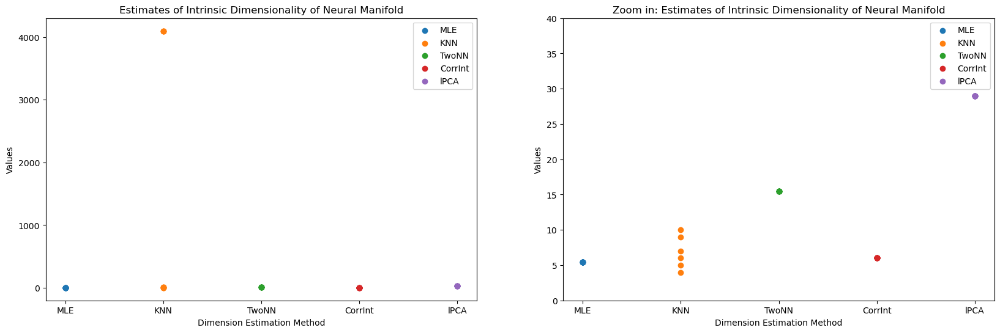

In [18]:
# make side by side plots
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

for i, method in enumerate(methods):
    y = id_estimates[method]
    x = np.repeat(i, len(y))
    axes[0].scatter(x, y, label=method)
    axes[1].scatter(x, y, label=method)

axes[0].set_xticks(range(len(methods)))
axes[0].set_xticklabels(methods)
axes[0].set_xlabel("Dimension Estimation Method")
axes[0].set_ylabel("Values")
axes[0].set_title("Estimates of Intrinsic Dimensionality of Neural Manifold")
axes[0].legend()

axes[1].set_xticks(range(len(methods)))
axes[1].set_xticklabels(methods)
axes[1].set_xlabel("Dimension Estimation Method")
axes[1].set_ylabel("Values")
axes[1].set_ylim([0, 40])
axes[1].set_title("Zoom in: Estimates of Intrinsic Dimensionality of Neural Manifold")
axes[1].legend();

estimate extrinsic with PCA, then do nonlinear dim est